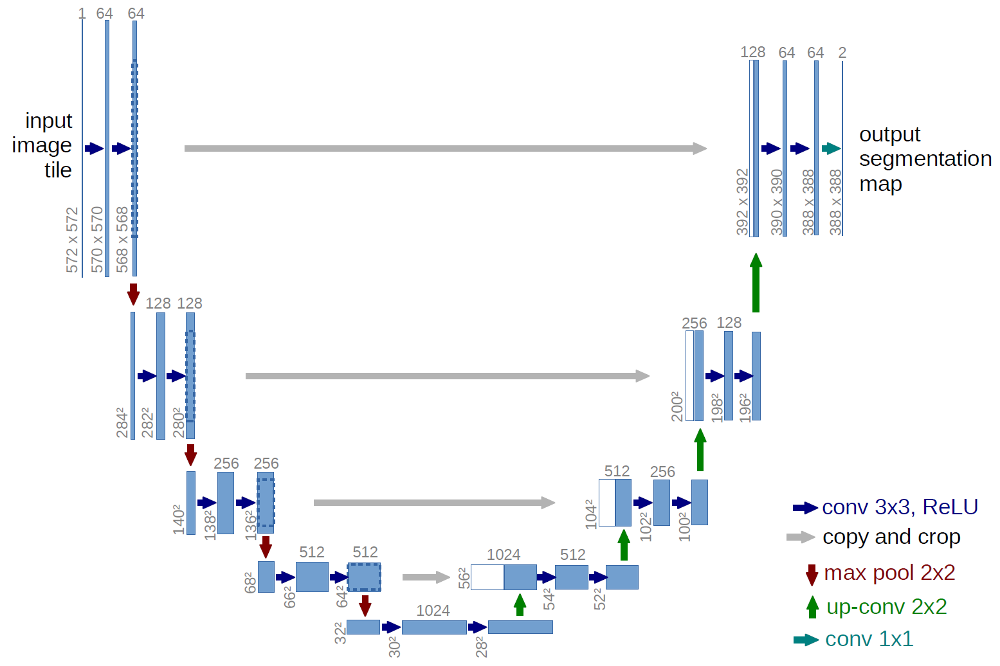

## Условие

Нужно реализовать `U-Net` в файле `model.py` для задачи семантической сегментации: `0` - не автомобиль, `1` - автомобиль.  Назовите класс с моделью `SegmenterModel`, унаследуйте его от `torch.nn.Module`, напишите метод `forward`. Ваша модель должна принимать четырёхмерные тензоры картинок (нулевая размерность — батч) и предсказывать трёхмерные тензоры (нулевая размерность — батч) из логарифмов вероятностей (логитов) каждого пикселя в бернуллиевской модели. В качестве функции ошибки при обучении используется **бинарная кросс-энтропия** в реализации с логитами — `torch.nn.BCEWithLogitsLoss()`. Переход от логитов к маске осуществляется посредством отсечения по порогу: `logits > 0`.

Нужно добиться среднего значения метрики `IoU` по тестовой выборке:
- **на зачёт** — хотя бы в `0.6`; 
- **на бонусные баллы** — хотя бы в `0.8` (авторское решение даёт `0.95`).  

Обучение модели, а также оценка её качества уже реализованы за вас. Ваша реализация должна быть согласована с уже написанным кодом (любая разумная реализация удовлетворяет этим требованиям; если вы уверены, что это не так, то напишите в чат курса).

Данные — подмножество датасета [Carvana](https://www.kaggle.com/c/carvana-image-masking-challenge) с Kaggle.  

**Рекомендации:**
- Используйте `Google Colab`. Загрузите туда `data.zip` (довольно долго), `carvana_dataset.py` и `train.py`. Эти файлы заранее скачайте себе на папку в GDrive, потом примонтируйте диск к `Colab` и выкачайте архив с данными оттуда. **Важно:** сначала выберите рантайм с `GPU`, а потом уже загружайте файлы! Файлы нужно именно загрузить, т.к. иначе работать будет слишком медленно (придётся при обучении каждый раз читать файлы по сети);
- Обучайте модель достаточно долго. Несколько десятков эпох это норма. 
- Прекращайте обучение только тогда, когда лосс на тестовой выборке перестаёт падать;
- Для визуализации процесса обучения используйте `tensorboard`. Он уже интегрирован в `training loop` для вас. Запустить его можно и на своей машине: просто скачайте папку `log` с Colab и введите в терминале `tensorboard --log_dir /path/to/log`

## Загрузка файлов и данных на Colab

Заранее сделайте папку на своём `GDrive`, потом примонтируйте её и скачайте оттуда все файлы.

In [1]:
from google.colab import drive
drive.mount('/content/drive')
#!cp -r ./drive/MyDrive/hw_6\(deep_learning\)/* .

Mounted at /content/drive


Распакуем данные на инстансе

In [2]:
cd /content/drive/MyDrive/hw_6(deep_learning)/.

/content/drive/MyDrive/hw_6(deep_learning)


In [3]:
ls -la

total 726226
-rw------- 1 root root      2314 Jun  4 09:49 carvana_dataset.py
drwx------ 2 root root      4096 Jun  3 21:28 data/
-rw------- 1 root root 456094993 Jun  3 09:35 data.zip
-rw------- 1 root root  16202686 Jun  5 16:47 hw_6_unet_2.ipynb
-rw------- 1 root root  19403732 Jun  5 16:46 hw_6_unet_reflect.ipynb
drwx------ 2 root root      4096 Jun  5 06:32 log/
drwx------ 2 root root      4096 Jun  5 09:36 log_2/
-rw------- 1 root root      5534 Jun  5 03:46 model_2.py
-rw------- 1 root root      6005 Jun  5 04:53 model.py
drwx------ 2 root root      4096 Jun  4 08:48 __pycache__/
-rw------- 1 root root      4066 Jun  5 03:39 train_2.py
-rw------- 1 root root      3947 Jun  5 04:54 train.py
-rw------- 1 root root 125956781 Jun  5 12:21 unet_2_dump_recent
-rw------- 1 root root 125956781 Jun  5 09:31 unet_dump_recent


In [ ]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


In [ ]:
!unzip data.zip -d data/

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: data/train/ebfdf6ec7ede_03.jpg  
  inflating: data/train/ebfdf6ec7ede_04.jpg  
  inflating: data/train/ebfdf6ec7ede_05.jpg  
  inflating: data/train/ebfdf6ec7ede_06.jpg  
  inflating: data/train/ebfdf6ec7ede_07.jpg  
  inflating: data/train/ebfdf6ec7ede_08.jpg  
  inflating: data/train/ebfdf6ec7ede_09.jpg  
  inflating: data/train/ebfdf6ec7ede_10.jpg  
  inflating: data/train/ebfdf6ec7ede_11.jpg  
  inflating: data/train/ebfdf6ec7ede_12.jpg  
  inflating: data/train/ebfdf6ec7ede_13.jpg  
  inflating: data/train/ebfdf6ec7ede_14.jpg  
  inflating: data/train/ebfdf6ec7ede_15.jpg  
  inflating: data/train/ebfdf6ec7ede_16.jpg  
  inflating: data/train/ed13cbcdd5d8_01.jpg  
  inflating: data/train/ed13cbcdd5d8_02.jpg  
  inflating: data/train/ed13cbcdd5d8_03.jpg  
  inflating: data/train/ed13cbcdd5d8_04.jpg  
  inflating: data/train/ed13cbcdd5d8_05.jpg  
  inflating: data/train/ed13cbcdd5d8_06.jpg  
  inflating:

In [ ]:
#!sudo apt install pv
#!unzip data.zip | pv -l >/dev/null

Reading package lists... Done
Building dependency tree       
Reading state information... Done
pv is already the newest version (1.6.6-1).
0 upgraded, 0 newly installed, 0 to remove and 39 not upgraded.
10.2k 0:00:06 [1.62k/s] [       <=>                                            ]


## Подключаем TensorBoard

Это нужно сделать до запуска скрипта с обучением.  Этот виджет интерактивный.  
Он автоматически обновляется по мере обучения модели

In [ ]:
!pip install tensorboardx
!mkdir log_2
%load_ext tensorboard
%tensorboard --logdir ./log_2

Output hidden; open in https://colab.research.google.com to view.

## Обучение модели

Для вашего удобства, обучение и валидация модели вынесены в отдельный файл `train.py`.  
При условии, что вы правильно реализовали модель, для начала обучения достаточно запустить ячейку ниже.  

На каждой итерации обученная модель сохраняется на диск в виде файла `unet_dump_recent`. Используйте это для отладки.  
Каждый дамп довольно объёмный — порядка 120 мб. для авторской модели, — но если вы хотите сохранять модель на диск по какой-то другой логике, то поправьте соответствующие строки в файле `train.py`.

In [ ]:
!python train_2.py --n_epochs 50 --batch_size 10 --learning_rate 3e-4

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Current epoch:  0
100% 458/458 [07:17<00:00,  1.05it/s]
Epoch loss 0.016310544303866453
Make test
100% 51/51 [00:48<00:00,  1.05it/s]
Test loss 0.011868481736952863
Current epoch:  1
100% 458/458 [03:36<00:00,  2.11it/s]
Epoch loss 0.007591380354618922
Make test
100% 51/51 [00:22<00:00,  2.24it/s]
Test loss 0.006415971452150289
Current epoch:  2
100% 458/458 [03:35<00:00,  2.13it/s]
Epoch loss 0.0059282733582968795
Make test
100% 51/51 [00:22<00:00,  2.25it/s]
Test loss 0.006256911522290838
Current epoch:  3
100% 458/458 [03:35<00:00,  2.

## Визуализация результатов

Импортируйте нужные библиотеки и отрисуйте предсказания модели на нескольких случайных объектах из тестовой выборки.

In [4]:
%load_ext autoreload
%autoreload 2

import torch
import torch.utils.data as dt
import numpy as np
from tqdm.auto import tqdm

import matplotlib.pyplot as plt
import seaborn as sns

from model_2 import Unet_2
from carvana_dataset import CarvanaDataset

%matplotlib inline

Датасет преобразуется в формат, совместимый с `torch.utils.data.DataLoader` посредством класса `CarvanaDataset`.  
**Не меняйте его**, примеры использования для своих нужд вы можете найти ниже:

In [5]:
train_data = CarvanaDataset('data/train/', 'data/train_masks/')
test_data = CarvanaDataset('data/test/', 'data/test_masks/')

Подгрузим предобученную модель. Если вы изменили логику сохранения копий модели на диск, отразите эти изменения и здесь тоже.

In [6]:
unet = Unet_2().cuda()
unet.load_state_dict(torch.load("unet_2_dump_recent", map_location="cuda:0"))
unet.train(False);

Код для отрисовки предсказаний модели на одной картинке

In [7]:
def plot_predictions_on_random_image(fitted_model: Unet_2, 
                                     test_data: CarvanaDataset, 
                                     seed: int = None):
    if seed is None:
        rvgen = np.random
    else:
        rvgen = np.RandomState(seed)
        
    n_img = len(test_data.files)
    img_idx = rvgen.randint(0, n_img)
    img = test_data[img_idx][0]
    true_mask = test_data[img_idx][1].squeeze(0)
    
    pred_logits = fitted_model.forward(img.unsqueeze(0).cuda())
    pred_logits = pred_logits\
                    .squeeze(0).squeeze(0)\
                    .detach().cpu().numpy()
    pred_mask = pred_logits > 0
    
    images_to_plot = [img.permute(1, 2, 0), true_mask, pred_mask, pred_logits]
    ax_titles = ["Оригинал", 
                 "Истинная маска",
                 "Предсказанная маска (порог — 0)", 
                 "Предсказанные логиты"]
    
    fig, axes = plt.subplots(1, 4, figsize=(20, 10))
    for i in range(len(axes)):
        ax = axes[i]
        ax.imshow(images_to_plot[i], cmap="inferno")
        ax.set_title(ax_titles[i], fontsize=15, fontweight="bold")
        ax.set_axis_off()

Сравним предсказанные маски с истинными 

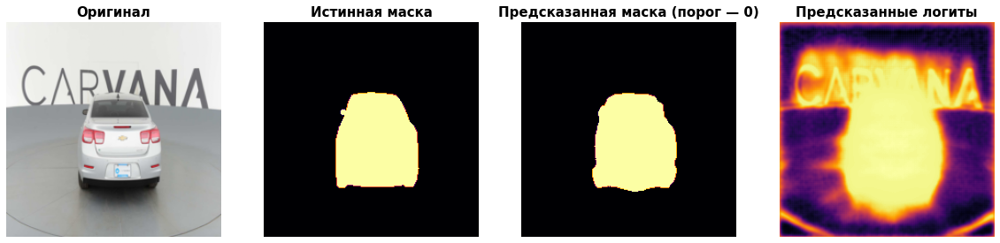

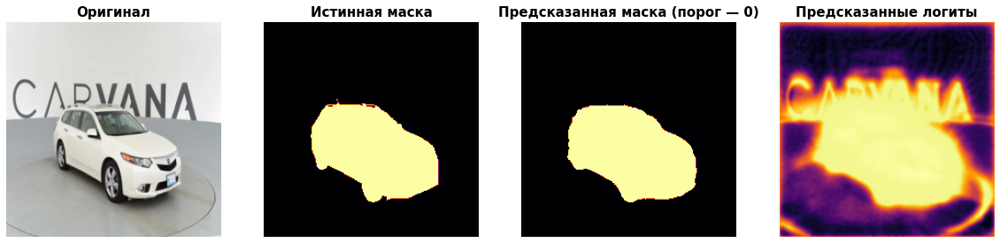

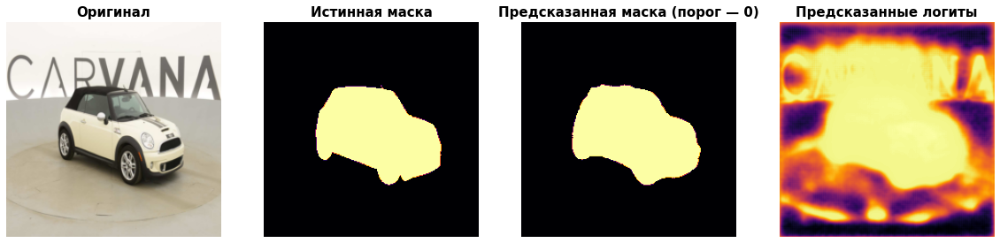

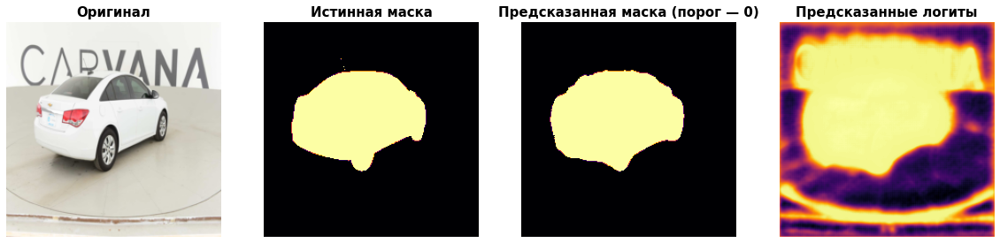

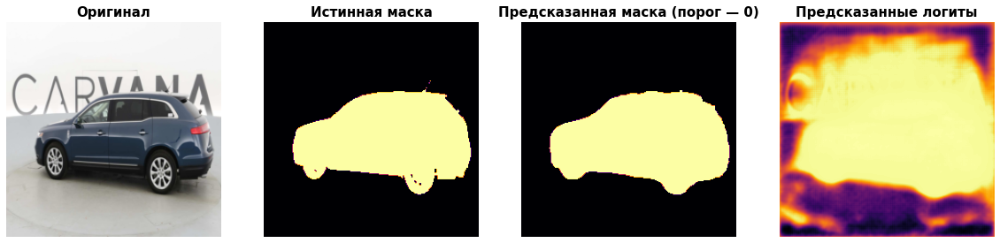

In [8]:
for i in range(5): 
    plot_predictions_on_random_image(unet, test_data)

## Оценка качества модели

В задаче семантической сегментации уместно использовать метрику `IoU` — *Intersection over Union* — которая равняется доле корректно предсказанных пикселей маски среди всех пикселей, которые либо модель, либо разметка считают пикселями маски

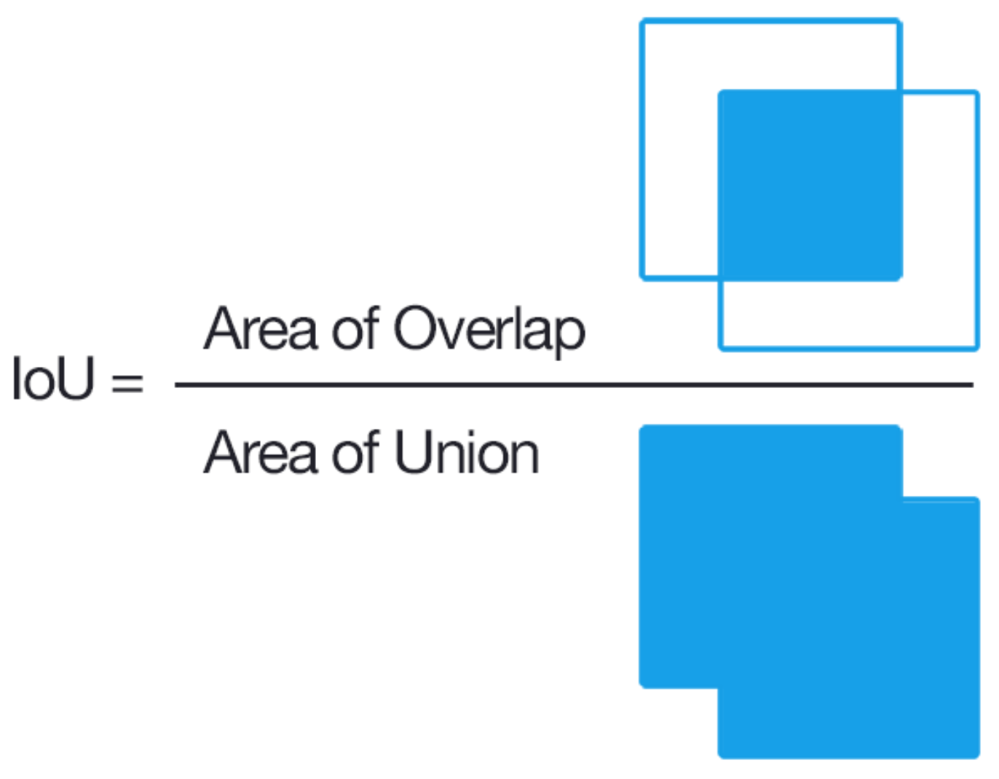

In [9]:
def iou_loss(predicted_mask_batch, target_mask_batch):
    """ Считает IoU по всем элементам батча """
    
    intersection = predicted_mask_batch & target_mask_batch
    union = predicted_mask_batch | target_mask_batch
    # batch-размерность не трогаем
    loss = intersection.double().sum((1, 2, 3)) \
            / union.double().sum((1, 2, 3))
    return loss

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Среднее значение IoU на тестовой выбрке: 0.9536387271213558


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


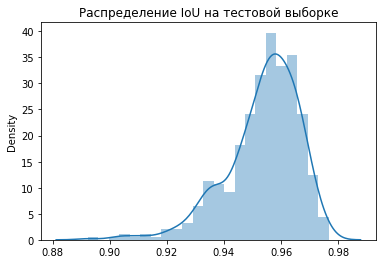

In [10]:
dl_test = dt.DataLoader(test_data, shuffle=False, 
                        num_workers=8,
                        batch_size=1)

    
test_loss = []
for i, (input_batch, target_mask_batch) in enumerate(tqdm(dl_test)):
    with torch.no_grad():
        output_logits_batch = unet(input_batch.to("cuda")).cpu()
    output_mask_batch = output_logits_batch > 0
    loss = iou_loss(output_mask_batch, target_mask_batch > 0)
    test_loss.append(loss.numpy())
test_loss = np.hstack(test_loss)

print(f"Среднее значение IoU на тестовой выбрке: {np.mean(test_loss)}")
plt.title("Распределение IoU на тестовой выборке")
sns.distplot(test_loss);

Пороги по `IoU` смотрите в самом начале задания

## Бонусная  часть
Попробуйте побить `baseline` в виде авторского решения:
1. Сделайте аугментацию данных;
2. Подберите оптимальную архитектуру (может отличаться от рекомендованной);
3. Обратитесь к литературе за сведениями о том, как делают fine-tuning для `U-Net`;